In [1]:
import numpy as np
import pandas as pd

# Bibliotecas gráficas
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [2]:
dfo = pd.read_parquet("datasets/raw.snappy.parquet")
dfo.head()

,id,name,market_type,benchmark,strategy,risk,liquidity,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
0,RRRP3,3R PETROLEUM ÓLEO E GÁS S.A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.131406,0.551172,-0.412630,-0.419996,0.076180,33.60
1,AERI3,AERIS IND. E COM. DE EQUIP. GERACAO DE ENERGIA...,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.609501,0.646211,-1.091786,-0.758763,0.085385,3.47
2,AESB3,AES BRASIL ENERGIA S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.213264,0.288464,-1.072189,-0.336788,0.038291,10.72
3,AFLT3,AFLUENTE TRANSMISSÃO DE ENERGIA ELÉTRICA S/A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.017996,0.388144,-0.293757,-0.148004,0.056708,8.91
4,AGXY3,AGROGALAXY PARTICIPAÇÕES S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.139182,0.611407,-0.384696,-0.445000,0.075715,7.86


In [3]:
dfo.columns

Index(['id', 'name', 'market_type', 'benchmark', 'strategy', 'risk',
       'liquidity', 'is_income_tax_free', 'market', 'investor', 'return',
       'volatility', 'sharpe', 'max_dd', 'var', 'minimum_application'],
      dtype='object')

### Funções de preparação do dataset

In [4]:
from collections import defaultdict
from sklearn.preprocessing import LabelEncoder, StandardScaler, normalize


def apply_label_encoding(df, to_label_cols, cols):
    label_encoder = defaultdict(LabelEncoder)
    to_label_df = df[to_label_cols]
    not_to_label_df = df[cols]
    to_label_df = to_label_df.apply(lambda x: label_encoder[x.name].fit_transform(x))
    le_df = to_label_df.join(not_to_label_df)
    return le_df


def apply_scaler(df):
    scaler = StandardScaler()
    scaled = scaler.fit_transform(df)
    scaled_df = pd.DataFrame(columns=df.columns, data=scaled)
    return scaled_df


def apply_normalizer(df):
    normalized = normalize(df)
    normalized_df = pd.DataFrame(columns=df.columns, data=normalized)
    return normalized_df
    

def prepare_dataset(df, to_label_cols, cols):
    labeled_df = apply_label_encoding(df, to_label_cols, cols)
    scaled_df = apply_scaler(labeled_df)
    normalized_df = apply_normalizer(scaled_df)
    return normalized_df

___

## Test Case 3 - RF
___
1. Todas as features do dataset
2. Desconsiderando atributos unicos (index, id, name)
3. Avaliação individual por mercado Renda Fixa

In [5]:
case_3_cols = ["risk", "liquidity", "return", "volatility", "sharpe", "max_dd", "var", "minimum_application"]
case_3_to_label_cols = ["market_type", "benchmark", "strategy", "is_income_tax_free", "market", "investor"]

name_map = {
    "Fundo de Investimento": "fn",
    "Renda Variável": "rv",
    "Renda Fixa": "rf"
}

case_3_df = dfo.copy()
for market, case_3_market_df in case_3_df.groupby("market"):
    case_3_market_df.to_parquet(f"datasets/test_case_3_{name_map[market]}_raw.snappy.parquet")
    # case_3_market_df.to_sql(f"test_case_3_{name_map[market]}_raw", engine, if_exists="replace")
    tmp_df = prepare_dataset(case_3_market_df, case_3_to_label_cols, case_3_cols)
    tmp_df.to_parquet(f"datasets/test_case_3_{name_map[market]}.snappy.parquet")
    # tmp_df.to_sql(f"test_case_3_{name_map[market]}", engine, if_exists="replace")

Renda Fixa

In [6]:
case_3_rfo = pd.read_parquet("datasets/test_case_3_rf_raw.snappy.parquet")
case_3_rf = pd.read_parquet("datasets/test_case_3_rf.snappy.parquet")

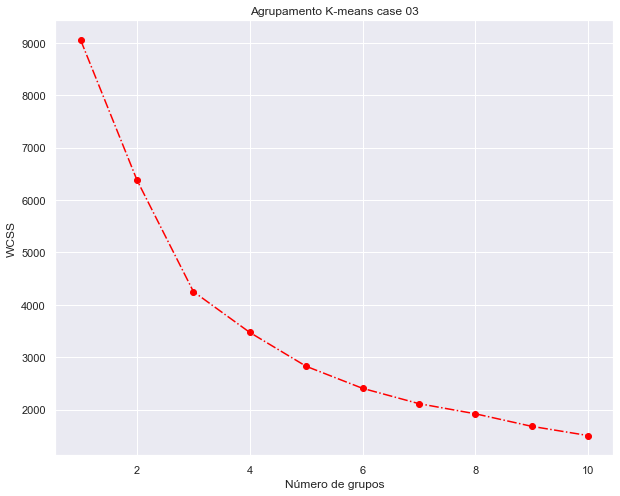

In [7]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    # inserir chamada ao K-means
    kmeans = KMeans(n_clusters=i, random_state=42)
    # agrupar
    kmeans.fit(case_3_rf)
    # salvar resultado
    wcss.append(kmeans.inertia_)

plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '-.',color='red')
plt.xlabel('Número de grupos')
plt.ylabel('WCSS')
plt.title('Agrupamento K-means case 03')
plt.show()

Mesmo dando 3 grupos foi definido que o mesmo devera ter 7 grupos!

In [8]:
n_cluster=7
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
kmeans.fit(case_3_rf)
df_segm_kmeans =  case_3_rfo.copy()
df_segm_kmeans = pd.DataFrame(data =  case_3_rf, columns =  case_3_rf.columns)
df_segm_kmeans['Grupo'] = kmeans.labels_ #atributo do modelo que informa os rótulos
df_segm_analise = df_segm_kmeans.groupby(['Grupo'])
investimentos = df_segm_analise.size()
df_segm_analise = df_segm_analise.mean() # Inserir a métrica necessária = média
df_segm_analise['investimentos'] = investimentos
df_segm_analise.rename({0:'0', 1:'1', 2:'2', 3:'3',4:'4', 5:'5', 6:'6', 7:'7' }) # Adicione quantos forem necessários
df_segm_analise.head(7)

,market_type,benchmark,strategy,is_income_tax_free,market,investor,risk,liquidity,return,volatility,sharpe,max_dd,var,minimum_application,investimentos
Grupo,,,,,,,,,,,,,,,
0,-0.216546,0.407511,0.008706,-0.243671,0.0,-0.364828,0.040610,-0.104328,0.260125,-0.367109,0.023997,0.097371,-0.472338,-0.038496,1272
1,0.392420,-0.319225,0.313534,0.267086,0.0,0.045172,-0.179572,-0.040389,-0.357598,-0.063775,-0.039246,0.063623,0.095695,0.067492,685
2,-0.216722,-0.037418,-0.444618,-0.238080,0.0,-0.047629,0.070832,-0.076940,0.302512,0.473266,0.016987,0.070512,0.334981,-0.033241,1341
3,-0.214930,-0.468898,0.461104,-0.195771,0.0,-0.162679,-0.336013,-0.089127,-0.230990,0.006046,0.006575,0.094658,0.071781,-0.028772,2048
4,0.189645,-0.024632,-0.300818,0.336483,0.0,0.087127,0.259157,0.286491,0.014956,0.317492,0.011071,-0.220034,0.303994,-0.030672,1567
5,0.582587,0.334344,0.007143,0.419195,0.0,0.119119,0.043415,-0.093940,-0.089892,-0.322358,0.016241,0.079888,-0.239427,-0.000147,673
6,-0.242453,0.443035,0.009465,-0.264912,0.0,0.398282,0.123415,-0.117947,0.182387,-0.406045,0.025136,0.105859,-0.460711,-0.016460,1559


In [9]:
# Crie uma PCA de 3 componentes
from sklearn.decomposition import PCA
pca = PCA(n_components= 3)
pca.fit(case_3_rf)
# Exiba os valores das componentes
print(pca.explained_variance_ratio_)

grupos_3d = pca.transform(case_3_rf) # Método de transformação da PCA
grupos_3d.shape
grupos_df_3d = pd.DataFrame(grupos_3d).loc[:,:2]
grupos_df_3d.columns = ['PC1','PC2','PC3']
grupos_df_3d.head(7)

[0.80156575 0.06585861 0.05135698]


,PC1,PC2,PC3
0,1.150315,0.115594,-0.146825
1,1.150451,0.115223,-0.145294
2,1.154292,0.109099,-0.106678
3,1.156812,0.099778,-0.082100
4,1.166108,0.066153,0.017682
5,0.186041,0.033845,0.238523
6,1.097332,-0.194014,-0.612192


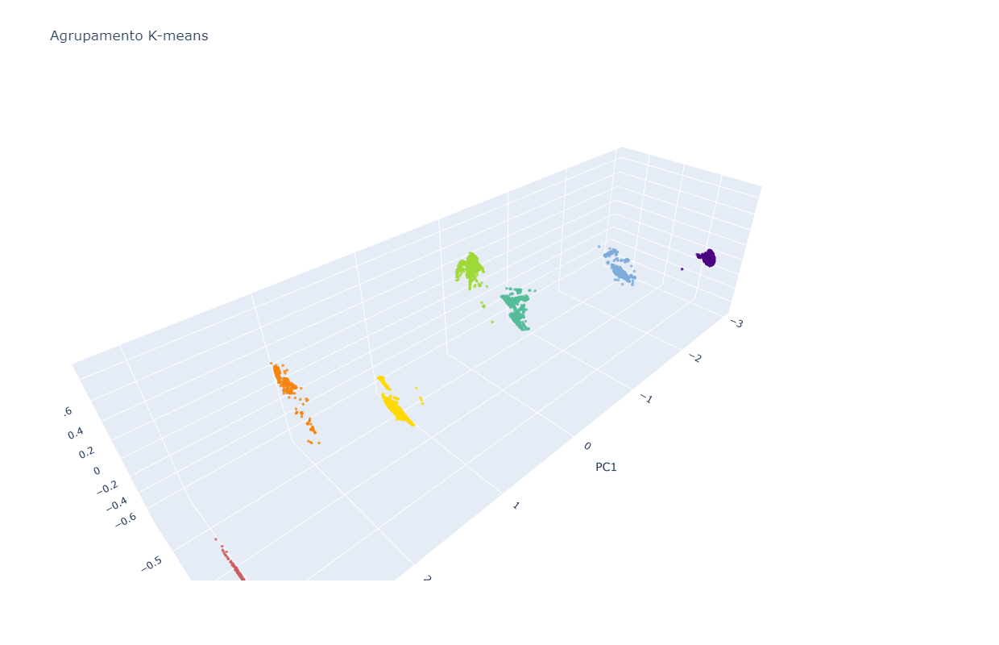

In [10]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>  '''))
  init_notebook_mode(connected=False)
  
  
from plotly.offline import init_notebook_mode
enable_plotly_in_cell()
init_notebook_mode(connected=False)

import plotly.offline as py
import plotly.graph_objs as go

trace1 = go.Scatter3d(
    x=grupos_df_3d["PC1"],
    y=grupos_df_3d["PC2"],
    z=grupos_df_3d["PC3"],
    mode='markers',
    text= kmeans.labels_,
    marker=dict(
        size=2,
        color= kmeans.labels_,         
        colorscale=[[0.0,"indianred"],[0.2,"darkorange"],[0.4,"yellow"],[0.6,"mediumseagreen"],[0.8,"skyblue"],[1.0, "indigo"]],
        opacity=0.8
    )
)

data = [trace1]
layout = go.Layout(
    showlegend=False,
    title="Agrupamento K-means",
    scene = dict(
        xaxis = dict(title="PC1"),
        yaxis = dict(title="PC2"),
        zaxis = dict(title="PC3")
    ),
    width=800,
    height=800
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')

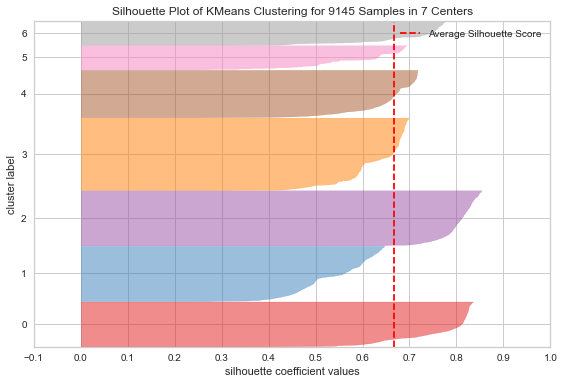

In [11]:
# SilhouetteVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer
n_clusters = 7 # Número de grupos que escolhemos
sil = SilhouetteVisualizer(KMeans(n_clusters)) # Método SilhouetteVisualizer
sil.fit(case_3_rf)
sil.finalize()
plt.tight_layout()
plt.show()

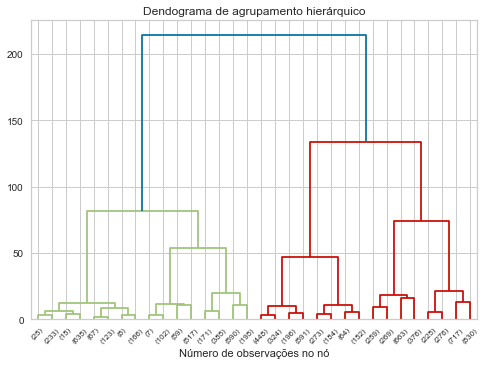

In [12]:
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    dendrogram(linkage_matrix, **kwargs)

# Consultar a scikit para encontrar o método de agrupamento acumulativo
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

dend = AgglomerativeClustering(distance_threshold=0, n_clusters= None) # Chamada do método
dend = dend.fit(case_3_rf)
plt.title("Dendograma de agrupamento hierárquico")
plot_dendrogram(dend, truncate_mode="level", p=4)
plt.xlabel("Número de observações no nó")
plt.show()

In [13]:
df_case3= df_segm_kmeans
df_mask0= df_case3['Grupo']== 0
df_case1= df_segm_kmeans
df_mask1= df_case3['Grupo']== 1
df_case1= df_segm_kmeans
df_mask2= df_case3['Grupo']== 2
df_case1= df_segm_kmeans
df_mask3= df_case3['Grupo']== 3
df_case1= df_segm_kmeans
df_mask4= df_case3['Grupo']== 4
df_case1= df_segm_kmeans
df_mask5= df_case3['Grupo']== 5
df_case1= df_segm_kmeans
df_mask6= df_case3['Grupo']== 6

filtered_df0 = df_case3[df_mask0]
filtered_df1 = df_case3[df_mask1]
filtered_df2 = df_case3[df_mask2]
filtered_df3 = df_case3[df_mask3]
filtered_df4 = df_case3[df_mask4]
filtered_df5 = df_case3[df_mask5]
filtered_df6 = df_case3[df_mask6]

from pandas_profiling import ProfileReport
profile = ProfileReport(filtered_df0,  minimal=True,title='case3_Fixa_grupo0', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case3_Fixa_grupo0.html") 
profile = ProfileReport(filtered_df1,  minimal=True,title='case3_Fixa_grupo1', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case3_Fixa_grupo1.html") 
profile = ProfileReport(filtered_df2,  minimal=True,title='case3_Fixa_grupo2', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case3_Fixa_grupo2.html") 
profile = ProfileReport(filtered_df3,  minimal=True,title='case3_Fixa_grupo3', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case3_Fixa_grupo3.html") 
profile = ProfileReport(filtered_df4, minimal=True, title='case3_Fixa_grupo4', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case3_Fixa_grupo4.html") 
profile = ProfileReport(filtered_df5,  minimal=True,title='case3_Fixa_grupo5', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case3_Fixa_grupo5.html") 
profile = ProfileReport(filtered_df6,  minimal=True,title='case3_Fixa_grupo6', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file="case3_Fixa_grupo6.html") 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

___